### **Embryonic Chicken Heart**

In [1]:
options(warn = -1)
suppressPackageStartupMessages({
    library(Seurat)
    library(ggplot2)
    library(cowplot)
    library(patchwork)
    library(dplyr)
    library(tidyr)
    library(readxl)
    library(ggpubr)
})

In [2]:
samples = c("D4", "D7LV", "D7RV", "D10LV", "D10RV", "D14LV", "D14RV")
smpl_info = list(case = 'ChickenEmbryo', TF0 = 'D4', TF1 = 'D7', TF2 = 'D10', TF3 = 'D14')

### *Step 1 : Analysis of single-cell datasets*

###### **Preprocessing, QC, Dimensionality reduction**

In [3]:
mito_genes = c("ND1", "ND2", "COX1", "COII", "ATP8", "ATP6", "COX3", "ND3", "ND4L", "ND4", "ND5", "CYTB", "ND6")

In [4]:
prepare_datasets <- function(sample_name, mito_genes){
    data <- Read10X_h5(paste0('../Data/GSE149457_chickenheart/scRNAseq_', sample_name, '.h5'), use.names = TRUE, unique.features = TRUE)
    seurat.object <- CreateSeuratObject(counts = data, min.cells = 3, min.features = 200, project = sample_name)

    seurat.object$percent_mito <- PercentageFeatureSet(seurat.object, features = mito_genes)
    return(seurat.object)
}

In [5]:
day4 = prepare_datasets(samples[1], mito_genes)
day7_lv = prepare_datasets(samples[2], mito_genes)
day7_rv = prepare_datasets(samples[3], mito_genes)
day10_lv = prepare_datasets(samples[4], mito_genes)
day10_rv = prepare_datasets(samples[5], mito_genes)
day14_lv = prepare_datasets(samples[6], mito_genes)
day14_rv = prepare_datasets(samples[7], mito_genes)

#day4 <- subset(day4, subset = nFeature_RNA <= 3000 & nCount_RNA <= 10500)
#day7_lv <- subset(day7_lv, subset = nFeature_RNA <= 2500 & nCount_RNA <= 7500)
#day7_rv <- subset(day7_rv, subset = nFeature_RNA <= 3000 & nCount_RNA <= 10500)
#day10_lv <- subset(day10_lv, subset = nFeature_RNA <= 1500 & nCount_RNA <= 3750)
#day10_rv <- subset(day10_rv, subset = nFeature_RNA <= 1500 & nCount_RNA <= 3750)
#day14_lv <- subset(day14_lv, subset = nFeature_RNA <= 1000 & nCount_RNA <= 2500)
#day14_rv <- subset(day14_rv, subset = nFeature_RNA <= 1000 & nCount_RNA <= 2500)

merged_srt = merge(day4, y = c(day7_lv, day7_rv, day10_lv, day10_rv, day14_lv, day14_rv), add.cell.ids = samples, project = "ChickenEmbryo")
merged_srt$orig.ident <- factor(x = merged_srt$orig.ident, levels = c(samples[1:7]))

In [6]:
options(repr.plot.height = 5, repr.plot.width = 20)
feats <- c("nFeature_RNA", "nCount_RNA", "percent_mito")

pdf(file = paste0("../Results - Chicken/1_scRNAseq/ChickenEmbryo_QC.pdf"), height = 5, width = 20, useDingbats=FALSE)
VlnPlot(merged_srt, features = feats, group.by = "orig.ident", pt.size = 0.1, ncol = 3) & theme(axis.title.x = element_blank())
plot_grid(FeatureScatter(merged_srt, "nCount_RNA", "nFeature_RNA", group.by = "orig.ident"),
          FeatureScatter(merged_srt, "nCount_RNA", "percent_mito", group.by = "orig.ident") + NoLegend(), ncol = 2)
dev.off()

merged_srt <- subset(merged_srt, subset = nFeature_RNA >= 200 & percent_mito <= 20)

agg_record_1912521242 
                    2

###### **Cell-cycle scoring**

In [7]:
merged_srt[["RNA"]] <- JoinLayers(merged_srt[["RNA"]])
DefaultAssay(merged_srt) <- "RNA"

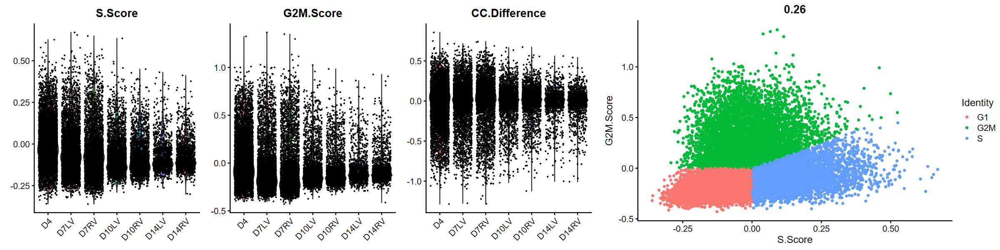

In [8]:
merged_srt <- NormalizeData(merged_srt, verbose = FALSE)
merged_srt <- CellCycleScoring(merged_srt, s.features = cc.genes$s.genes, g2m.features = cc.genes$g2m.genes)
merged_srt$CC.Difference <- merged_srt$S.Score - merged_srt$G2M.Score

options(repr.plot.height = 5, repr.plot.width = 20)
plot_grid(VlnPlot(merged_srt, features = c("S.Score", "G2M.Score", "CC.Difference"), group.by = "orig.ident") & theme(axis.title.x = element_blank()),
          FeatureScatter(merged_srt, "S.Score", "G2M.Score", group.by = "Phase"), rel_widths = c(3, 2))

###### **Doublet prediction**

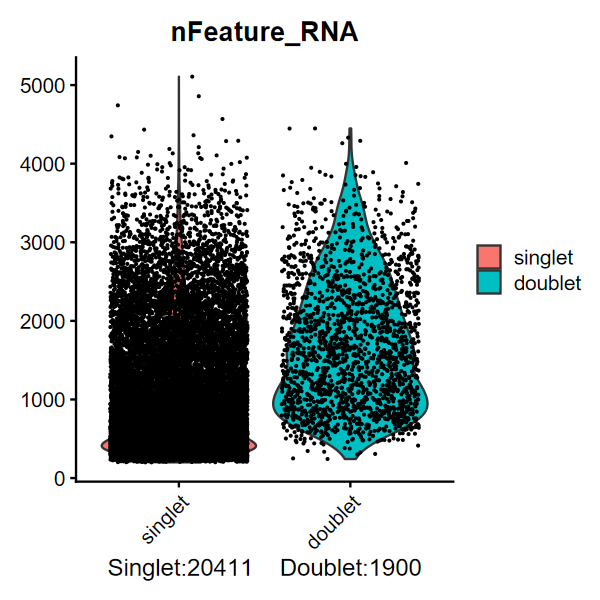

In [9]:
suppressPackageStartupMessages({
    library(scDblFinder)
    library(SingleCellExperiment)
})
sce <- as.SingleCellExperiment(merged_srt)
sce <- suppressMessages(scDblFinder(sce))
merged_srt <- as.Seurat(sce)
merged_srt$ident <- NULL

doublet.count = paste0("Singlet:", length(grep("singlet", merged_srt$scDblFinder.class)), "    ",
                       "Doublet:", length(grep("doublet", merged_srt$scDblFinder.class)))
options(repr.plot.height = 5, repr.plot.width = 5)
VlnPlot(merged_srt, features = "nFeature_RNA", group.by = "scDblFinder.class") & xlab(doublet.count)

In [10]:
merged_srt <- subset(merged_srt, subset = scDblFinder.class  == "singlet")         # Remove doublets

###### **FVF, Scaling, Dimensionality Reduction, ...**

In [11]:
Elbow_vis <- function(object) {
    pct <- object[["pca"]]@stdev / sum(object[["pca"]]@stdev) * 100      # Determine percent of variation associated with each PC
    cumu <- cumsum(pct)                                                  # Calculate cumulative percents for each PC

    # Determine which PC exhibits cumulative percent greater than 90% and % variation associated with the PC as less than 5
    co1 <- which(cumu > 90 & pct < 5)[1]  
    # Determine the difference between variation of PC and subsequent PC, and last point where change of % of variation is more than 0.1%.
    co2 <- sort(which((pct[1:length(pct) - 1] - pct[2:length(pct)]) > 0.1), decreasing = T)[1] + 1

    pcs <- min(co1, co2)                                                 # Minimum of the two calculation

    plot_df <- data.frame(pct = pct, cumu = cumu, rank = 1:length(pct))  # Create a dataframe with values

    # Elbow plot to visualize 
    ggplot(plot_df, aes(cumu, pct, label = rank, color = rank > pcs)) + geom_text() + geom_vline(xintercept = 90, color = "grey") + 
           geom_hline(yintercept = min(pct[pct > 5]), color = "grey") + theme_bw()
}

In [13]:
merged_srt <- FindVariableFeatures(merged_srt, selection.method = "vst", nfeatures = 2000, verbose = FALSE)
p1 <- LabelPoints(plot = VariableFeaturePlot(merged_srt), points = head(VariableFeatures(merged_srt), 20), xnudge = 0, ynudge = 0, repel = TRUE)

merged_srt <- ScaleData(merged_srt, vars.to.regress = c("nFeature_RNA", "percent_mito", "percent_ribo", "percent_hemo", "CC.Difference"), verbose = FALSE)
merged_srt <- RunPCA(merged_srt, features = VariableFeatures(merged_srt), npcs = 50, verbose = FALSE)
p2 <- Elbow_vis(merged_srt)

options(repr.plot.height = 5, repr.plot.width = 20)
pdf(file = paste0("../Results - Chicken/1_scRNAseq/VF & Elbow.pdf"), height = 5, width = 20, useDingbats=FALSE)
plot_grid(p1, p2, ncol = 2)
dev.off()

agg_record_1677384275 
                    2

In [13]:
merged_srt <- FindNeighbors(merged_srt, dims = 1:15, verbose = FALSE)
merged_srt <- RunUMAP(merged_srt, dims = 1:15, verbose = FALSE)

In [14]:
saveRDS(merged_srt, file = paste0("../Results - Chicken/1_scRNAseq/ChickenEmbryo_NoCCA.rds"), compress = TRUE)

###### **Clustering**

In [3]:
#rm(list = ls())
srtobj <- readRDS(paste0("../Results - Chicken/1_scRNAseq/ChickenEmbryo_INT_Unfiltered.rds"))
#srtobj <- subset(srtobj, orig.ident == c('D4'))

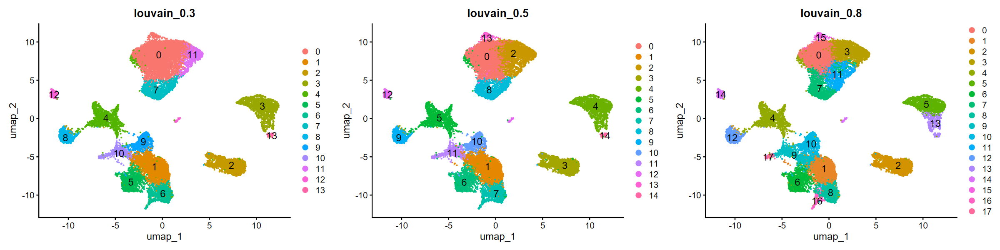

In [4]:
srtobj <- FindClusters(srtobj, resolution = c(0.3 ,0.5, 0.8), verbose = FALSE)

options(repr.plot.height = 5, repr.plot.width = 20)
plot_grid(DimPlot(srtobj, group.by = "CCA_snn_res.0.3", label = TRUE, label.size = 5) + ggtitle("louvain_0.3"), 
          DimPlot(srtobj, group.by = "CCA_snn_res.0.5", label = TRUE, label.size = 5) + ggtitle("louvain_0.5"),
          DimPlot(srtobj, group.by = "CCA_snn_res.0.8", label = TRUE, label.size = 5) + ggtitle("louvain_0.8"), ncol = 3)

In [5]:
Idents(srtobj) <- "CCA_snn_res.0.3"
DefaultAssay(srtobj) <- "RNA"
t(table(Idents(srtobj), srtobj$orig.ident))

       
           0    1    2    3    4    5    6    7    8    9   10   11   12   13
  D4    1461  204  487  671  460  516  226  180   46  247   25   72  123    0
  D7LV  1309  246  535  403  240  165  259  293  101  113   99  200   57   53
  D7RV  1167  120  433  288  139  203  223  284   69   95   42  138   49   29
  D10LV  727  659  160   74  157  131   68  179   84   93  156  106   16    2
  D10RV  387  467  222  104  297   57  235   70   98   97  130   68   10    0
  D14LV  164  398   38   27  120   51   91   31  154   52  102   36   16    2
  D14RV  186  474   55   33  179   92  103   40  217   55  144   36   22    1

###### **DEGs**

In [6]:
DEG_table = FindAllMarkers(srtobj, assay = "RNA", do.print = TRUE, logfc.threshold = 0.5, return.thresh = 0.1, min.pct = 0.5, only.pos = TRUE, verbose = FALSE)
DEG_table <- subset(DEG_table[!(rownames(DEG_table) %in% grep("^ENSGAL", x = rownames(DEG_table), value = TRUE)),])
DEG_table$diff.pct <- DEG_table$pct.1 - DEG_table$pct.2
write.csv(DEG_table, "../Results - Chicken/1_scRNAseq/DEG_table.csv")

top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% dplyr::filter(avg_log2FC > 1) %>% slice_head(n = 25) %>% ungroup())
#top_markers = DEG_table %>% group_by(cluster) %>% top_n(5, avg_log2FC)
#levels(top_markers$cluster) == levels(srtobj$CCA_snn_res.0.5)

In [7]:
feat <- c('POSTN', 'COL3A1', 'DCN', 'TNNC1', 'TNNT2', 'IRX4', 'PITX2', 'NKX2-5', 'TEK', 'NPC2', 'NPR3', 'NFATC1', 'CD34', 'PECAM1', 'CDH5', 'MSX1', 'SOX9', 'TMSB4X', 'TGFB2', 'WT1', 'LUM', 'ALDH1A2', 'HBZ', 'APLN', 'FABP5', 'TM4SF18', 'RGS5', 'MYH11', 'TAGLN', 'ACTA2', 'TBX18', 'TCF21', 'LCP1', 'CSF1R', 'IFI6')
#POSTN, COL3A1, DCN, TNNC1, TNNT2, IRX4, PITX2, NKX2-5, TEK, NPC2, NPR3, NFATC1, CD34, PECAM1, CDH5, MSX1, SOX9, TMSB4X, TGFB2, WT1, LUM, ALDH1A2, HBZ, APLN, FABP5, TM4SF18, RGS5, MYH11, TAGLN, ACTA2, TBX18, TCF21, LCP1, CSF1R, IFI6

pdf 
  2

pdf 
  2

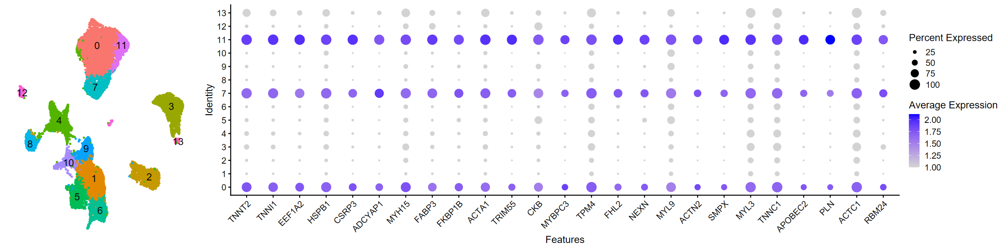

In [8]:
cl = top_markers[which(top_markers$cluster == 0), ]

options(repr.plot.height = 5, repr.plot.width = 20)
plot_grid(DimPlot(srtobj, pt.size = 0.5, label = TRUE, label.size = 5) & NoLegend() & NoAxes(),
          DotPlot(srtobj, features = cl$gene[1:25], dot.min = 0, col.min = 1.0) & RotatedAxis(), rel_widths = c(1, 4))

options(repr.plot.height = 8, repr.plot.width = 20)
png(file = paste0("../Results - Chicken/1_scRNAseq/featureplot.png"), height = 2000, width = 1500)
FeaturePlot(srtobj, features = cl$gene[1:25], label = TRUE, min.cutoff = "q10", ncol = 5)
dev.off()

options(repr.plot.height = 8, repr.plot.width = 20)
png(file = paste0("../Results - Chicken/1_scRNAseq/vlnplot.png"), height = 2000, width = 1500)
VlnPlot(srtobj, features = cl$gene[1:25], pt.size = 0, ncol = 5)
dev.off()

In [9]:
head(top_markers[which(top_markers$cluster == 0), ], 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,diff.pct
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<dbl>
1,0,2.765936,0.926,0.329,0,0,TNNT2,0.597
2,0,2.530692,0.900,0.306,0,0,TNNI1,0.594
3,0,2.653742,0.816,0.243,0,0,EEF1A2,0.573
4,0,2.509504,0.961,0.420,0,0,HSPB1,0.541
5,0,2.640111,0.712,0.191,0,0,CSRP3,0.521
6,0,2.452559,0.692,0.180,0,0,ADCYAP1,0.512
7,0,2.826455,0.954,0.446,0,0,MYH15,0.508
8,0,2.310963,0.802,0.301,0,0,FABP3,0.501
9,0,2.405038,0.759,0.271,0,0,FKBP1B,0.488


###### **Cell-type identification**

In [ ]:
CellMarkerDB <- data.frame(read_xlsx("./Data/PanglaoDB.xlsx"))
CellMarkerDB <- data.frame(subset(CellMarkerDB, 
                                  species == 'Human' & tissue_class == 'Brain' & cancer_type == 'Glioblastoma', 
                                  select = c('species', 'tissue_class', 'tissue_type', 'cancer_type', 'cell_name', 'marker', 'Symbol','Genetype')))
#head(CellMarkerDB, 5)

In [ ]:
feats = cl$gene[1:30]
gene_marker <- CellMarkerDB[which(CellMarkerDB$marker %in% feats | CellMarkerDB$Symbol %in% feats),]
gene_marker
t(as.data.frame(table(gene_marker$cell_name)))

###### **Celltype annotation**

In [10]:
new.cluster.ids = c('0' = "Cardiomyocytes",
                    '1' = "Fibroblast cells",
                    '2' = "Endocardial cells",
                    '3' = "Erythrocytes",
                    '4' = "TMSB4X high cells",
                    '5' = "Valve cells",
                    '6' = "Epi-epithelial cells",
                    '7' = "Endocardial cells",
                    '8' = "Vascular endothelial cells",
                    '9' = "Epi-mesenchymal cells",
                    '10'= "Mural cells",
                    '11'= "Immature myocardial cells",                  
                    '12'= "Macrophages",                  
                    '13'= "Erythrocytes")                 
names(new.cluster.ids) = levels(srtobj)
srtobj = RenameIdents(srtobj, new.cluster.ids)
srtobj$cell_types <- as.character(srtobj@active.ident)

saveRDS(srtobj, file = paste0("../Results - Chicken/1_scRNAseq/chicken_Final.rds"), compress = TRUE)

pdf(file = paste0("../Results - Chicken/1_scRNAseq/chicken_Final.pdf"), width = 10, height = 10, onefile = TRUE)
DimPlot(srtobj, label = TRUE, label.size = 4, repel = TRUE)
dev.off()

pdf 
  2

In [11]:
library(RColorBrewer)

pt <- as.data.frame(table(Idents(srtobj), srtobj$orig.ident))
pt$Var1 <- as.character(pt$Var1)
pt$Var2 <- factor(x = pt$Var2, levels = c(samples[1:7]))
pt <- pt %>% group_by(Var2) %>% mutate(percent = round(Freq / sum(Freq), 2))

options(repr.plot.height = 5, repr.plot.width = 20)
pdf(file = paste0("../Results - Chicken/1_scRNAseq/chicken_celltypePercent.pdf"), width = 20, height = 5, onefile = TRUE)
ggplot(pt, aes(x = Var2, y = Freq, fill = Var1)) + coord_flip() + theme_bw(base_size = 15) + geom_col(position = "fill", width = 0.5) +
           geom_text(aes(label = scales::percent(percent)), size = 4, position = position_fill(vjust = 0.5), angle = 90) +
           xlab("Time frames") + ylab("Proportion") + scale_fill_manual(values = brewer.pal(12, "Paired")) + theme(legend.title = element_blank())
dev.off()

pdf 
  2

### *Step 2 : Analysis of spatial datasets*

###### **Preprocessing, QC**

In [3]:
spatial_data = Load10X_Spatial("../Data/GSE149457_chickenheart/D14/",
                               "chicken_heart_spatial_RNAseq_D14.h5", assay = "Spatial", slice = "image", filter.matrix = TRUE)
spatial_data@meta.data$barcode <- row.names(spatial_data@meta.data)
spatial_data@meta.data <- spatial_data@meta.data[, c("orig.ident", "barcode", "nCount_Spatial", "nFeature_Spatial")]

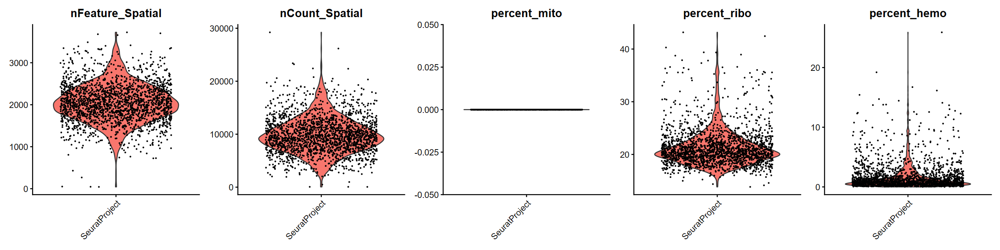

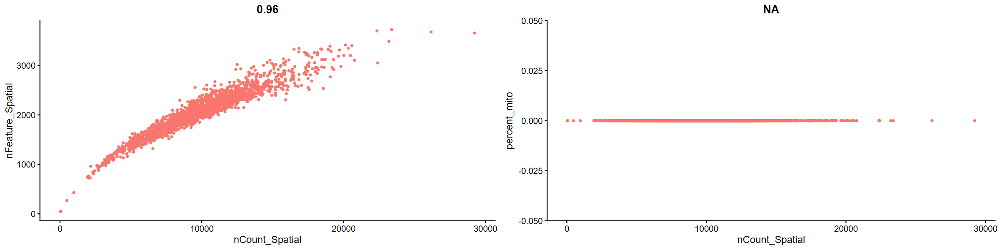

In [4]:
spatial_data[['percent_mito']] <- PercentageFeatureSet(spatial_data, pattern = '^MT-')
spatial_data[['percent_ribo']] <- PercentageFeatureSet(spatial_data, pattern = '^RP[SL]')
spatial_data[['percent_hemo']] <- PercentageFeatureSet(spatial_data, pattern = '^HB[^(P)]')

options(repr.plot.height = 5, repr.plot.width = 20)
feats <- c("nFeature_Spatial", "nCount_Spatial", "percent_mito", "percent_ribo", "percent_hemo")

VlnPlot(spatial_data, features = feats, group.by = "orig.ident", pt.size = 0.1, ncol = 5) & theme(axis.title.x = element_blank())
plot_grid(FeatureScatter(spatial_data, "nCount_Spatial", "nFeature_Spatial", group.by = "orig.ident") + NoLegend(),
          FeatureScatter(spatial_data, "nCount_Spatial", "percent_mito", group.by = "orig.ident") + NoLegend(), ncol = 2)

spatial_data <- spatial_data[!grepl("MALAT1", rownames(spatial_data)), ]        # Filter MALAT1
spatial_data <- spatial_data[!grepl("^MT-", rownames(spatial_data)), ]          # Filter Mitocondrial genes
spatial_data <- spatial_data[!grepl("^RP[SL]", rownames(spatial_data)), ]       # Filter Ribossomal genes
spatial_data <- spatial_data[!grepl("^HB[^(P)]", rownames(spatial_data)), ]     # Filter Hemoglobin genes
#spatial_data <- subset(spatial_data, subset = nFeature_Spatial < 8000 & nFeature_Spatial > 500 & nCount_Spatial < 35000 & percent_mito < 15 & percent_ribo < 20 & percent_hemo < 0.3)

###### **Dimensionality reduction, Clustering**

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


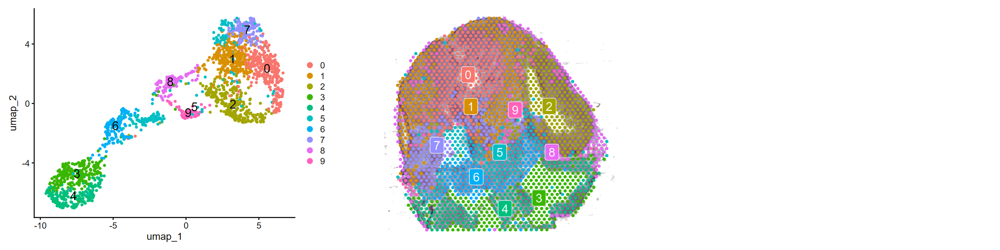

In [5]:
spatial_data <- spatial_data %>% SCTransform(assay = "Spatial", vst.flavor = "v1", verbose = FALSE) %>%
                                 RunPCA(assay = "SCT", verbose = FALSE) %>% 
                                 FindNeighbors(dims = 1:30, verbose = FALSE) %>%
                                 FindClusters(resolution = 0.8, verbose = FALSE) %>%
                                 RunUMAP(dims = 1:30, verbose = FALSE)

plot_grid(DimPlot(spatial_data, reduction = "umap", label = TRUE, label.size = 6, pt.size = 1),
          SpatialDimPlot(spatial_data, label = TRUE, label.size = 6, pt.size = 2) + NoLegend(), ncol = 3)
#SpatialDimPlot(stData, cells.highlight = CellsByIdentities(stData, idents = c(2, 1, 4, 3, 5, 8)), facet.highlight = TRUE, ncol = 6)

###### **Identification of Spatially Variable Features (SVF)**

In [6]:
SpatiallyVariableFeatures_workaround <- function(object, assay="SCT", selection.method = "moransi") {
    #' This is work around function to replace SeuratObject::SpatiallyVariableFeatures function.
    #' return ranked list of Spatially Variable Features
    
    # Check if object is a Seurat object
    if (!inherits(object, "Seurat")) {
        stop("object must be a Seurat object")
    }
    
    # Check if assay is a valid assay
    if (!assay %in% names(object@assays)) {
        stop("assay must be a valid assay")
    }
    
    # Extract meta.features from the specified object and assay
    data <- object@assays[[assay]]@meta.features
    
    # Select columns starting with the provided col_prefix
    moransi_cols <- grep(paste0("^", selection.method), colnames(data), value = TRUE)
    
    # Filter rows where "moransi.spatially.variable" is TRUE
    filtered_data <- data[data[[paste0(selection.method, ".spatially.variable")]], moransi_cols]
    
    # Sort filtered data by "moransi.spatially.variable.rank" column in ascending order
    sorted_data <- filtered_data[order(filtered_data[[paste0(selection.method, ".spatially.variable.rank")]]), ]
    
    # Return row names of the sorted data frame
    rownames(sorted_data)
}

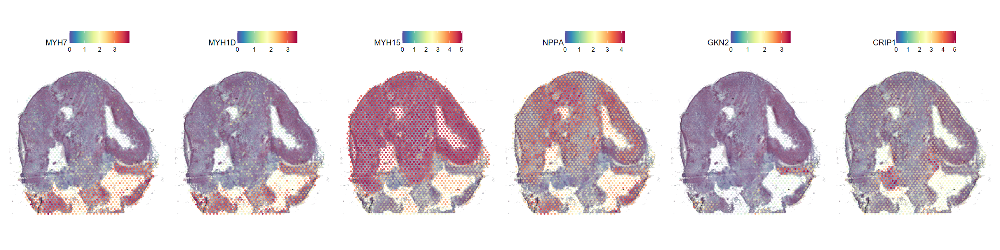

In [7]:
spatial_data <- FindSpatiallyVariableFeatures(spatial_data, assay = 'SCT', 
                                              features = VariableFeatures(spatial_data)[1:25], selection.method = 'moransi', verbose = FALSE)
top.features <- head(SpatiallyVariableFeatures_workaround(spatial_data, selection.method = 'moransi'), 6)
SpatialPlot(spatial_data, features = top.features, ncol = 6, alpha = c(0.1, 1))

In [8]:
saveRDS(spatial_data, file = paste0("../Results - Chicken/2_stRNAseq/D14_SVF.rds"), compress = TRUE)

###### **DEGs**

In [ ]:
DEG_table <- FindAllMarkers(spatial_data, logfc.threshold = 0.1, only.pos = TRUE, verbose = FALSE)
DEG_table$diff.pct <- DEG_table$pct.1 - DEG_table$pct.2

In [ ]:
#top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% top_n(-25, p_val_adj))
#top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% top_n(25, diff.pct) %>% top_n(50, avg_log2FC) %>% top_n(-100, p_val_adj))
#top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% top_n(-25, p_val_adj) %>% filter(avg_log2FC > 1))
top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% dplyr::filter(avg_log2FC > 1) %>% slice_head(n = 25) %>% ungroup())

In [ ]:
cl = top_markers[which(top_markers$cluster == 15), ]
feat <- c('LPL', 'TNC', 'PON2', 'PLAT', 'SLC1A3')

options(repr.plot.height = 4, repr.plot.width = 20)
plot_grid(DimPlot(spatial_data, pt.size = 0.5, label = TRUE, label.size = 5) & NoLegend() & NoAxes(),
          DotPlot(spatial_data, features = cl$gene, dot.min = 0, col.min = 0) & RotatedAxis(), rel_widths = c(1, 4))

options(repr.plot.height = 7, repr.plot.width = 20)
VlnPlot(spatial_data, features = cl$gene[1:10], pt.size = 0, ncol = 5)
FeaturePlot(spatial_data, features = cl$gene[1:10], label = TRUE, min.cutoff = "q10", ncol = 5)
#VlnPlot(spatial_data, features = feat, pt.size = 0, ncol = 5)
#FeaturePlot(spatial_data, features = feat, label = TRUE, min.cutoff = "q10", ncol = 5)

In [ ]:
head(top_markers[which(top_markers$cluster == 15), ], 10)

In [ ]:
new.cluster.ids = c('0' = "Neurons",
                    '1' = "Endothelial cells", 
                    '2' = "Microglial cells", 
                    '3' = "Epithelial cells",
                    '4' = "Oligodendrocytes", 
                    '5' = "Astrocytes", 
                    '6' = "Neurons", 
                    '7' = "Neurons",
                    '8' = "Epithelial cells",
                    '9' = "Oligodendrocyte precursor cells",
                    '10'= "Fibroblasts")
names(new.cluster.ids) = levels(spatial_data)
spatial_data = RenameIdents(spatial_data, new.cluster.ids)
spatial_data$cell_types <- as.character(spatial_data@active.ident)

saveRDS(spatial_data, file = paste0("./Results/2_stRNAseq/Human_Glioblastoma_Whole_SVF.rds"), compress = TRUE)

pdf(file = paste0("./Results/2_stRNAseq/Human_Glioblastoma_Whole_SVF.pdf"), height = 5, width = 20, useDingbats=FALSE)
plot_grid(DimPlot(spatial_data, reduction = "umap", repel = TRUE, label = TRUE, label.size = 5),
          SpatialDimPlot(spatial_data, repel = TRUE, label = TRUE, label.size = 5))
dev.off()

### *Step 3 : Spatial transcriptomics deconvolution at Single-cell resolution*

###### **Loading of Single-cell and Spatial datasets**

In [3]:
smpl <- samples[1]
reference <- readRDS("./1_scRNAseq/chicken_Final.rds")               # integrated scRNA data
reference <- reference[, reference$orig.ident == smpl]               # Select samples of "reference"

query <- readRDS("./2_stRNAseq/D14_SVF.rds")                         # spatial data
query <- UpdateSeuratObject(query)

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Updating matrix keys for DimReduc 'pca'

Updating matrix keys for DimReduc 'umap'

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Updating slots in Spatial

Updating slots in SCT

Updating slots in SCT_nn

Setting default assay of SCT_nn to SCT

Updating slots in SCT_snn

Setting default assay of SCT_snn to SCT

Updating slots in pca

Updating slots in umap

Setting umap DimReduc to global

Updating slots in image

Updated Centroids object 'centroids' in FOV 'image'

Updated boundaries in FOV 'image'

Setting assay used for SCTransform.Spatial to Spatial

Setting assay used for RunPCA.SCT to SCT

Setting assay used for FindNeighbors.SCT.pca to SCT

No assay information could be found for FindClusters

Setting assay used for RunUMAP.SCT.pca to SCT

Setting assay used for FindSpatiallyVariableFeatures.SCT to SCT

Validating object structure fo

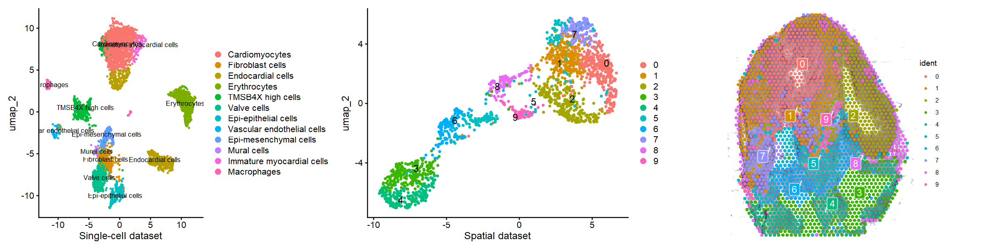

In [4]:
options(repr.plot.height = 5, repr.plot.width = 20)
#pdf(file = paste0("./Results/3_deconvolution/", smpl, "_plots.pdf"), height = 5, width = 20, useDingbats=FALSE)
plot_grid(DimPlot(reference, label = TRUE, label.size = 3.5) & xlab("Single-cell dataset"),
          DimPlot(query, label = TRUE, label.size = 5, repel = TRUE) & xlab("Spatial dataset"),
          SpatialDimPlot(query, label = TRUE, label.size = 5, pt.size.factor = 2.5, repel = TRUE), ncol = 3)
#dev.off()

###### **Cell Type Deconvolution(CARD)**

In [5]:
###### **Preparing required input data**

spatial_count <- query[["Spatial"]]$counts
spatial_location <- GetTissueCoordinates(query)
colnames(spatial_count) <- gsub(" ", "x", paste(spatial_location$x, spatial_location$y))
rownames(spatial_location) <- gsub(" ", "x", paste(spatial_location$x, spatial_location$y))
spatial_location$cell <- NULL

sc_count <- reference[["RNA"]]$counts
sc_meta <- reference@meta.data[, c('orig.ident', 'cell_types')]
sc_meta$cellID <- rownames(sc_meta)
sc_meta <- sc_meta[, c('cellID', 'orig.ident', 'cell_types')]
colnames(sc_meta) <- c('cellID', 'sampleInfo', 'cellType')

In [6]:
suppressPackageStartupMessages({
    library(CARD)
    library(SingleCellExperiment)
})
CARD_obj = createCARDObject(sc_count, sc_meta, spatial_count, spatial_location, ct.varname = "cellType", 
                            ct.select = unique(sc_meta$cellType), sample.varname = "sampleInfo", minCountGene = 100, minCountSpot = 5) 
CARD_obj = suppressMessages(CARD_deconvolution(CARD_obj))

## QC on scRNASeq dataset! ...
## QC on spatially-resolved dataset! ...
## create reference matrix from scRNASeq...
## Select Informative Genes! ...
## Deconvolution Starts! ...
## Deconvolution Finish! ...


In [7]:
# 1. Number of spatial spots (after filtering)
n_spots <- nrow(CARD_obj@spatial_location)
  
# 2. Number of reference single cells used for deconvolution
#    (this comes from the sc_meta that was used when creating the object)
n_ref_cells <- nrow(sc_meta)   # or ncol(CARD_obj@sc_eset) depending on version
  
# 3. Cell-type abundances (sum of proportions across all spots)
prop_mat <- CARD_obj@Proportion_CARD
celltype_abundance <- colSums(prop_mat)

# Create a data frame for this sample
df <- data.frame(Sample = smpl, n_spatial_spots = n_spots, n_reference_cells = n_ref_cells,
                 t(celltype_abundance),          # one column per cell type
                 stringsAsFactors = FALSE, check.names = FALSE)

# Write to CSV
write.csv(df, file = paste0("./3_deconvolution/", smpl, "_CARDsummary.csv"), row.names = FALSE)

In [7]:
## visualize the spatial distribution of the cell type proportion at a standard resolution
p1 <- CARD.visualize.prop(CARD_obj@Proportion_CARD, CARD_obj@spatial_location, sort(colnames(CARD_obj@Proportion_CARD)), NumCols = 6, pointSize = 0.5)

## visualize the spatial distribution of the cell type proportion at an enhanced resolution
CARD_obj = CARD.imputation(CARD_obj, NumGrids = 4000, ineibor = 10, exclude = NULL)
location_imputation = cbind.data.frame(x=as.numeric(sapply(strsplit(rownames(CARD_obj@refined_prop), split="x"),"[",1)),
                                       y=as.numeric(sapply(strsplit(rownames(CARD_obj@refined_prop), split="x"),"[",2)))
rownames(location_imputation) = rownames(CARD_obj@refined_prop)
p2 <- CARD.visualize.prop(CARD_obj@refined_prop, location_imputation, sort(colnames(CARD_obj@refined_prop)), NumCols = 6, pointSize = 0.5)

saveRDS(CARD_obj, file = paste0("../Results - Chicken/3_deconvolution/D4.rds"), compress = TRUE)

pdf(file = paste0("../Results - Chicken/3_deconvolution/D4_decon.pdf"), height = 6, width = 13, useDingbats=FALSE)
plot_grid(p1 , p2, labels = c('Unrefined', 'Refined'), nrow = 2)
CARD.visualize.Cor(CARD_obj@Proportion_CARD, colors = NULL) 

dev.off()

## The rownames of locations are matched ...
## Make grids on new spatial locations ...


pdf 
  2

###### **Cell Type Deconvolution(RCTD)**

In [ ]:
library(spacexr)

# create the RCTD reference object
Idents(reference) <- "cell_types"
counts <- reference[["RNA"]]$counts
cluster <- as.factor(reference$cell_types)
nUMI <- reference$nCount_RNA
levels(cluster) <- gsub("/", "-", levels(cluster))
cluster <- droplevels(cluster)
scRNA <- Reference(counts, cluster, nUMI)

# create the RCTD query object
counts_hd <- query[["Spatial"]]$counts
cortex_cells_hd <- colnames(query[["Spatial"]])
coords <- GetTissueCoordinates(query)[cortex_cells_hd, 1:2]
stRNA <- SpatialRNA(coords, counts_hd, colSums(counts_hd))

In [ ]:
myRCTD <- create.RCTD(stRNA, scRNA, max_cores = 8)
myRCTD <- suppressMessages(run.RCTD(myRCTD, doublet_mode = 'doublet'))
query  <- AddMetaData(query, metadata = myRCTD@results$results_df)

In [ ]:
barcodes <- colnames(myRCTD@spatialRNA@counts)
cell_type_names <- myRCTD@cell_type_info$info[[2]] 
norm_weights <- normalize_weights(myRCTD@results$weights)

options(repr.plot.height = 5, repr.plot.width = 20)
plot_cond_occur(cell_type_names, './Results/', norm_weights, myRCTD@spatialRNA)
plot_weights_unthreshold(cell_type_names, myRCTD@spatialRNA, './Results/', norm_weights) 

### *Step 4 : Learning-based Modeling of Tumor Cell Migration*

##### **Data Loading, Extracting of cell location based on the cell types**

In [3]:
suppressPackageStartupMessages({
    library(CARD)
    library(SingleCellExperiment)
})

In [4]:
CARDobj_0 <- readRDS(paste0('../Results - Chicken/3_deconvolution/D4.rds'))
CARDobj_1 <- readRDS(paste0('../Results - Chicken/3_deconvolution/D7.rds'))
CARDobj_2 <- readRDS(paste0('../Results - Chicken/3_deconvolution/D10.rds'))
CARDobj_3 <- readRDS(paste0('../Results - Chicken/3_deconvolution/D14.rds'))

In [5]:
scMapping_0 <- CARD_SCMapping(CARDobj_0, shapeSpot = "Circle", numCell = 20, ncore = 1)
scMapping_1 <- CARD_SCMapping(CARDobj_1, shapeSpot = "Circle", numCell = 20, ncore = 1)
scMapping_2 <- CARD_SCMapping(CARDobj_2, shapeSpot = "Circle", numCell = 20, ncore = 1)
scMapping_3 <- CARD_SCMapping(CARDobj_3, shapeSpot = "Circle", numCell = 20, ncore = 1)

In [6]:
MapCellCords_0 = as.data.frame(colData(scMapping_0))
count_SC_0 = assays(scMapping_0)$counts

MapCellCords_1 = as.data.frame(colData(scMapping_1))
count_SC_1 = assays(scMapping_1)$counts

MapCellCords_2 = as.data.frame(colData(scMapping_2))
count_SC_2 = assays(scMapping_2)$counts

MapCellCords_3 = as.data.frame(colData(scMapping_3))
count_SC_3 = assays(scMapping_3)$counts

CellLoc <- data.frame(x = MapCellCords_0$x, y = MapCellCords_0$y, centerSPOT = MapCellCords_0$centerSPOT, centerx = MapCellCords_0$centerx, centery = MapCellCords_0$centery)
CellLoc$TF0 <- 0; CellLoc$TF0_ct <- MapCellCords_0$CT
CellLoc$TF1 <- 1; CellLoc$TF1_ct <- MapCellCords_1$CT
CellLoc$TF2 <- 2; CellLoc$TF2_ct <- MapCellCords_2$CT
CellLoc$TF3 <- 3; CellLoc$TF3_ct <- MapCellCords_3$CT

write.csv(CellLoc, file = paste0("../Results - Chicken/4_modelling/", smpl_info$case, "_CellLoc.csv"), row.names = FALSE, col.names=TRUE)

##### **Statistical analyses**

In [3]:
stats_df <- read.csv(paste0('./4_modelling/chicken_CellLoc.csv'), header = TRUE, check.names = FALSE)

In [4]:
stats_df <- stats_df %>% mutate(across(c(x,y,centerx,centery,TF0,TF1,TF2,TF3), ~ suppressWarnings(as.numeric(trimws(as.character(.))))),
                    across(c(centerSPOT, TF0_ct, TF1_ct, TF2_ct, TF3_ct), ~ trimws(as.character(.))))

stats_df$RowID <- seq_len(nrow(stats_df))
stats_df$dist_to_center <- sqrt((stats_df$x - stats_df$centerx)^2 + (stats_df$y - stats_df$centery)^2)

tf01 <- data.frame(RowID = stats_df$RowID, interval = "TF0→TF1", from_time = 0, to_time = 1, baseline_ct = stats_df$TF0_ct, to_ct = stats_df$TF1_ct, 
                   changed = stats_df$TF0_ct != stats_df$TF1_ct, dist = stats_df$dist_to_center, stringsAsFactors = FALSE)

tf12 <- data.frame(RowID = stats_df$RowID, interval = "TF1→TF2", from_time = 1, to_time = 2, baseline_ct = stats_df$TF1_ct, to_ct = stats_df$TF2_ct, 
                   changed = stats_df$TF1_ct != stats_df$TF2_ct, dist = stats_df$dist_to_center, stringsAsFactors = FALSE)

tf23 <- data.frame(RowID = stats_df$RowID, interval = "TF2→TF3", from_time = 2, to_time = 3, baseline_ct = stats_df$TF2_ct, to_ct = stats_df$TF3_ct, 
                   changed = stats_df$TF2_ct != stats_df$TF3_ct, dist = stats_df$dist_to_center, stringsAsFactors = FALSE)

transitions <- bind_rows(tf01, tf12, tf23)

diff_summary <- transitions %>% group_by(baseline_ct, interval) %>% summarise(N = n(),
                                                                              n_changed = sum(changed, na.rm = TRUE), 
                                                                              prop_changed = ifelse(N>0, mean(changed, na.rm = TRUE), NA_real_),
                                                                              .groups = "drop")

diff_overall <- transitions %>% group_by(interval) %>% summarise(N = n(), n_changed = sum(changed, na.rm = TRUE),
                                                                 prop_changed = ifelse(N>0, mean(changed, na.rm = TRUE), NA_real_),
                                                                 .groups = "drop") %>% mutate(baseline_ct = "__ALL__") %>% select(baseline_ct, everything())

diff_sum <- bind_rows(diff_summary, diff_overall)

In [5]:
diff_tests <- list()
baseline_levels <- unique(transitions$baseline_ct)

for (ct in baseline_levels) {
    sub <- transitions %>% filter(baseline_ct == ct)
    # build contingency table: interval x changed
    tab <- table(sub$interval, sub$changed)
    # choose test: if 2x2 -> Fisher; else -> try chisq, and also Fisher if desired
    if (nrow(tab) == 2 && ncol(tab) == 2) {
        p_fisher <- fisher.test(tab)$p.value
        method <- "Fisher_2x2"
        diff_tests[[ct]] <- tibble(baseline_ct = ct, method = method, p_value = p_fisher)
    } else {
        # For >2 intervals, do chi-square; also compute Fisher p-value if feasible
        chisq_p <- tryCatch(chisq.test(tab)$p.value, error = function(e) NA_real_)
                            # Fisher for RxC (may be slow) - we try but wrap in tryCatch
                            fisher_p <- tryCatch(fisher.test(tab)$p.value, error = function(e) NA_real_, warning = function(w) NA_real_)
                                diff_tests[[ct]] <- tibble(baseline_ct = ct, method = "ChiSq", p_value = chisq_p, fisher_p = fisher_p)
    }
}

diff_tests_df <- bind_rows(diff_tests)
# If there are multiple p-values columns, standardize column names
if ("p_value" %in% names(diff_tests_df) && "fisher_p" %in% names(diff_tests_df)) {
    diff_tests_df <- diff_tests_df %>% mutate(p_fisher = fisher_p, p_chisq = p_value) %>% select(baseline_ct, everything())
}

# For pairwise (consecutive interval) Fisher tests and p.adjust:
pairwise_list <- list()
interval_levels <- unique(transitions$interval)
for (ct in baseline_levels) {
    sub <- transitions %>% filter(baseline_ct == ct)
    # for each consecutive pair of intervals:
    ints <- sort(unique(sub$interval))
    if (length(ints) >= 2) {
        for (j in seq_len(length(ints)-1)) {
            i1 <- ints[j]; i2 <- ints[j+1]
            tab <- table(sub$interval %in% c(i1,i2) , sub$changed) # simpler build
            # better: filter to two intervals
            sub2 <- sub %>% filter(interval %in% c(i1,i2))
            tab2 <- table(sub2$interval, sub2$changed)
            p <- tryCatch(fisher.test(tab2)$p.value, error = function(e) NA_real_)
                          pairwise_list[[paste(ct, i1, i2, sep = "|")]] <- tibble(baseline_ct = ct, group1 = i1, group2 = i2, p_value = p)
        }
    }
}
pairwise_df <- bind_rows(pairwise_list)
pairwise_df <- pairwise_df %>% group_by(baseline_ct) %>% mutate(p_adj = p.adjust(p_value, method = "fdr")) %>% ungroup()

# ===== 5) Migration summary & tests =====
migration_summary <- transitions %>% group_by(baseline_ct, interval) %>% summarise(mean_dist = mean(dist, na.rm = TRUE),
                                                                                   sd_dist = sd(dist, na.rm = TRUE), N = n(),
                                                                                   se_dist = sd_dist / sqrt(N), .groups = "drop")

# ANOVA / Kruskal-Wallis per baseline_ct across all intervals
migration_tests <- list()
for (ct in baseline_levels) {
    sub <- transitions %>% filter(baseline_ct == ct)
    # require at least two intervals with data
    if (length(unique(sub$interval)) >= 2) {
        # check normality of residuals quickly with Shapiro (on residuals of lm) - optional
        aov_res <- tryCatch(aov(dist ~ interval, data = sub), error = function(e) NULL)
                            if (!is.null(aov_res)) {
                                p_anova <- summary(aov_res)[[1]][["Pr(>F)"]][1]
                            } else 
                                p_anova <- NA_real_
        # also kruskal
        p_kruskal <- tryCatch(kruskal_test(data = sub, dist ~ interval)$p, error = function(e) NA_real_)
                              migration_tests[[ct]] <- tibble(baseline_ct = ct, p_anova = p_anova, p_kruskal = p_kruskal)
        } else {
            migration_tests[[ct]] <- tibble(baseline_ct = ct, p_anova = NA_real_, p_kruskal = NA_real_)
    }
}
migration_tests_df <- bind_rows(migration_tests) %>% mutate(p_anova_adj = p.adjust(p_anova, method = "fdr"), p_kruskal_adj = p.adjust(p_kruskal, method = "fdr"))

In [6]:
format_p <- function(p){
    if(is.na(p))
        return("NA")

    ## Never display p = 0
    if(p < 1e-16)
        return("p<1e-16")

    paste0("p=", formatC(p, format = "e", digits = 2))
}

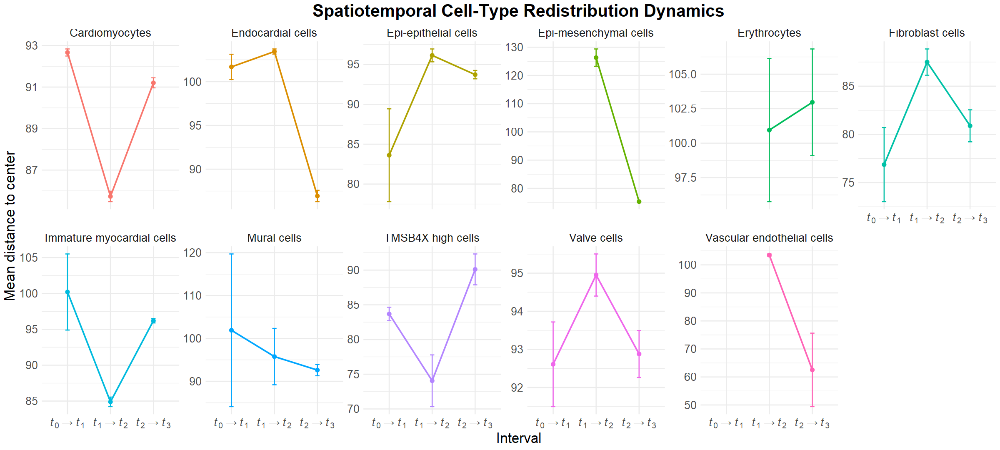

In [7]:
# Migration plot (all cell types on single plot)
mig_plot_sum <- migration_summary %>% filter(!is.na(interval)) %>% mutate(interval = factor(interval, levels = unique(interval)))

# Keep only valid pairwise pvals for plotting (if any) using migration tests (use p_anova_adj)
# Build small pvals table keyed by baseline_ct with interval pairs if needed (we'll use pairwise from diff for demo)
p_mig_plot <- migration_tests_df %>%
    mutate(group1 = as.character(mig_plot_sum$interval[1]), # placeholder if you want pairwise, otherwise leave empty
           group2 = as.character(mig_plot_sum$interval[2]))  # not ideal for >2 intervals; better do pairwise t-tests if desired
# For simplicity we won't auto-annotate migration pairwise here to avoid mismatch; user can request specific pairwise tests.

options(repr.plot.height = 9, repr.plot.width = 20)
p <- ggplot(mig_plot_sum, aes(x = interval, y = mean_dist, group = baseline_ct, color = baseline_ct)) +
            geom_point(size = 2) + geom_line(size = 0.8) + geom_errorbar(aes(ymin = mean_dist - se_dist, ymax = mean_dist + se_dist), width = 0.1) +
            facet_wrap(~ baseline_ct, nrow = 2, scales = "free_y") + labs(title = "Spatiotemporal Cell-Type Redistribution Dynamics", 
                                                                          y = "Mean distance to center", x = "Interval") +
            scale_x_discrete(labels = c("TF0→TF1" = expression(italic(t)[0] %->% italic(t)[1]),
                                        "TF1→TF2" = expression(italic(t)[1] %->% italic(t)[2]),
                                        "TF2→TF3" = expression(italic(t)[2] %->% italic(t)[3]))) +
            theme_minimal(base_size = 12) +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"), text = element_text(size = 20), legend.position = "none", panel.spacing.y = unit(2, "lines"))

p
ggsave("../Embryonic chicken heart/4_modelling/Redist_plot.png", p, width = 40, height = 12, dpi = 350, units = "cm", limitsize = FALSE)

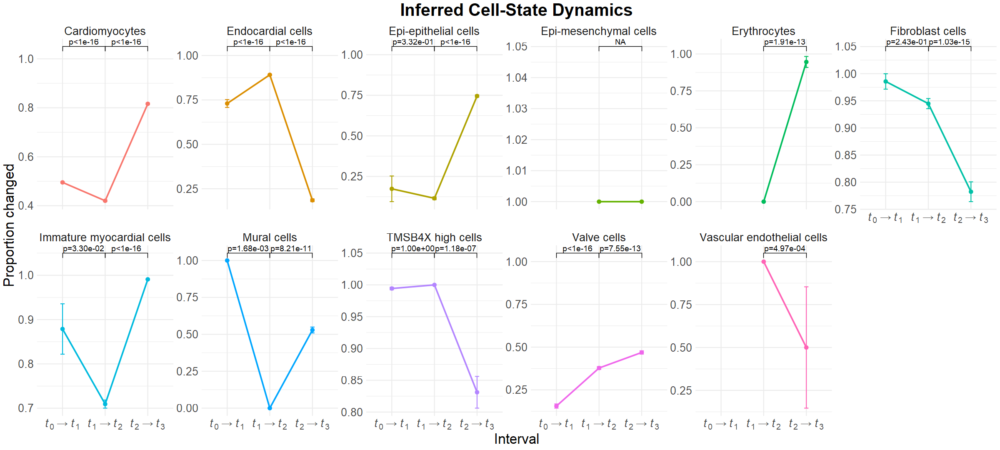

In [8]:
# ===== 6) Visualization =====
# Differentiation plot: proportion changed per interval per baseline_ct (faceted single row)
summary_plot <- diff_summary %>% filter(!is.na(interval)) %>% mutate(interval = factor(interval, levels = unique(interval)))

# Prepare pairwise pvals for plotting (only valid ones)
valid_intervals <- levels(summary_plot$interval)
pvals_plot <- pairwise_df %>% filter(group1 %in% valid_intervals, group2 %in% valid_intervals) %>% 
                              mutate(y.position = max(summary_plot$prop_changed, na.rm = TRUE) + 0.05, label = vapply(p_adj, format_p, character(1)))

## Plot
options(repr.plot.height = 9, repr.plot.width  = 20)
p <- ggplot(summary_plot, aes(x = interval, y = prop_changed, group = baseline_ct, color = baseline_ct)) + 
            geom_point(size = 2) + geom_line(linewidth = 0.8) + 
            geom_errorbar(aes(ymin = prop_changed - sqrt(prop_changed * (1 - prop_changed) / N), ymax = prop_changed +
                                                           sqrt(prop_changed * (1 - prop_changed) / N)), width = 0.10) +
            facet_wrap(~baseline_ct, nrow = 2, scales = "free_y") +
            scale_x_discrete(labels = c("TF0→TF1" = expression(italic(t)[0] %->% italic(t)[1]),
                                        "TF1→TF2" = expression(italic(t)[1] %->% italic(t)[2]),
                                        "TF2→TF3" = expression(italic(t)[2] %->% italic(t)[3]))) +
            labs(title = "Inferred Cell-State Dynamics", x = "Interval", y = "Proportion changed") +
            theme_minimal(base_size = 10) + theme(plot.title = element_text(hjust = 0.5, face = "bold"), text = element_text(size = 20),
                                                  legend.position = "none", panel.spacing.y = unit(2, "lines"))

## Add p-values
if(nrow(pvals_plot) > 0){
    p <- p + stat_pvalue_manual(pvals_plot, label = "label", hide.ns = TRUE)
}

## Save figure
print(p)
ggsave("../Embryonic chicken heart/4_modelling/CellState_plot.png", p, width = 40, height = 12, dpi = 350, units = "cm", limitsize = FALSE)

In [9]:
# ===== 7) Generate Results sentences automatically (Differentiation pairwise + Migration ANOVA) =====
sentences <- c()
# Differentiation: use pairwise_df (consecutive intervals)
for (ct in unique(pairwise_df$baseline_ct)) {
    rows <- pairwise_df %>% filter(baseline_ct == ct)
    if (nrow(rows) == 0) {
        sentences <- c(sentences, paste0("Differentiation frequency of ", ct, " could not be tested due to insufficient data."))
    } else {
        for (r in seq_len(nrow(rows))) {
            rowr <- rows[r,]
            # find props
            pstart <- diff_summary %>% filter(baseline_ct == ct & interval == rowr$group1) %>% pull(prop_changed)
            pend   <- diff_summary %>% filter(baseline_ct == ct & interval == rowr$group2) %>% pull(prop_changed)
            pstart_v <- ifelse(length(pstart)==0, NA, round(100*pstart,1))
            pend_v   <- ifelse(length(pend)==0, NA, round(100*pend,1))
            sentences <- c(sentences, paste0("Differentiation frequency of ", ct, " changed from ", pstart_v, "% in ", rowr$group1,
                                             " to ", pend_v, "% in ", rowr$group2, " (Fisher’s exact test, p_adj = ", signif(rowr$p_adj,3), ")."))
        }
    }
}
# Migration: report mean per interval and ANOVA p_adj
for (ct in unique(migration_tests_df$baseline_ct)) {
    rowm <- migration_tests_df %>% filter(baseline_ct == ct)
    if (nrow(rowm) == 0) next
    # collect means for intervals
    means <- migration_summary %>% filter(baseline_ct == ct) %>% arrange(interval) %>% pull(mean_dist)
    intervals_list <- migration_summary %>% filter(baseline_ct == ct) %>% arrange(interval) %>% pull(interval)
    if (length(means) >= 2) {
        # present first two for brevity, or all
        mean_strings <- paste0(round(means,2), collapse = " → ")
        sentences <- c(sentences, paste0("Migration rate of ", ct, " changed (means: ", mean_strings, "; ANOVA p_adj = ", signif(rowm$p_anova_adj,3), ")."))
    } else {
        sentences <- c(sentences, paste0("Migration rate of ", ct, " has insufficient intervals for ANOVA."))
    }
}

sentences

[1] "Differentiation frequency of Cardiomyocytes changed from 49.5% in TF0→TF1 to 42% in TF1→TF2 (Fisher’s exact test, p_adj = 2.15e-63)."           
 [2] "Differentiation frequency of Cardiomyocytes changed from 42% in TF1→TF2 to 81.6% in TF2→TF3 (Fisher’s exact test, p_adj = 0)."                  
 [3] "Differentiation frequency of TMSB4X high cells changed from 99.4% in TF0→TF1 to 100% in TF1→TF2 (Fisher’s exact test, p_adj = 1)."              
 [4] "Differentiation frequency of TMSB4X high cells changed from 100% in TF1→TF2 to 83.1% in TF2→TF3 (Fisher’s exact test, p_adj = 1.18e-07)."       
 [5] "Differentiation frequency of Endocardial cells changed from 73% in TF0→TF1 to 89.1% in TF1→TF2 (Fisher’s exact test, p_adj = 2.89e-18)."        
 [6] "Differentiation frequency of Endocardial cells changed from 89.1% in TF1→TF2 to 18.5% in TF2→TF3 (Fisher’s exact test, p_adj = 0)."             
 [7] "Differentiation frequency of Valve cells changed from 15.5% in TF0→TF1 to 37.8% in TF1→TF2 (Fisher’s exact test, p_adj = 1.24e-38)."            
 [8] "Differentiation frequency of Valve cells changed from 37.8% in TF1→TF2 to 46.9% in TF2→TF3 (Fisher’s exact test, p_adj = 7.55e-13)."            
 [9] "Differentiation frequency of Fibroblast cells changed from 98.6% in TF0→TF1 to 94.5% in TF1→TF2 (Fisher’s exact test, p_adj = 0.243)."          
[10] "Differentiation frequency of Fibroblast cells changed from 94.5% in TF1→TF2 to 78.2% in TF2→TF3 (Fisher’s exact test, p_adj = 1.03e-15)."       
[11] "Differentiation frequency of Epi-epithelial cells changed from 17.4% in TF0→TF1 to 11.5% in TF1→TF2 (Fisher’s exact test, p_adj = 0.332)."      
[12] "Differentiation frequency of Epi-epithelial cells changed from 11.5% in TF1→TF2 to 74.5% in TF2→TF3 (Fisher’s exact test, p_adj = 0)."          
[13] "Differentiation frequency of Immature myocardial cells changed from 87.9% in TF0→TF1 to 70.9% in TF1→TF2 (Fisher’s exact test, p_adj = 0.033)." 
[14] "Differentiation frequency of Immature myocardial cells changed from 70.9% in TF1→TF2 to 99.1% in TF2→TF3 (Fisher’s exact test, p_adj = 0)."     
[15] "Differentiation frequency of Mural cells changed from 100% in TF0→TF1 to 0% in TF1→TF2 (Fisher’s exact test, p_adj = 0.00168)."                 
[16] "Differentiation frequency of Mural cells changed from 0% in TF1→TF2 to 52.9% in TF2→TF3 (Fisher’s exact test, p_adj = 8.21e-11)."               
[17] "Differentiation frequency of Vascular endothelial cells changed from 100% in TF1→TF2 to 50% in TF2→TF3 (Fisher’s exact test, p_adj = 0.000497)."
[18] "Differentiation frequency of Epi-mesenchymal cells changed from 100% in TF1→TF2 to 100% in TF2→TF3 (Fisher’s exact test, p_adj = NA)."          
[19] "Differentiation frequency of Erythrocytes changed from 0% in TF1→TF2 to 94.6% in TF2→TF3 (Fisher’s exact test, p_adj = 1.91e-13)."              
[20] "Migration rate of Cardiomyocytes changed (means: 92.67 → 85.73 → 91.2; ANOVA p_adj = 6.44e-120)."                                               
[21] "Migration rate of TMSB4X high cells changed (means: 83.68 → 74.06 → 90.1; ANOVA p_adj = 0.0014)."                                               
[22] "Migration rate of Endocardial cells changed (means: 101.69 → 103.44 → 86.94; ANOVA p_adj = 3.23e-143)."                                         
[23] "Migration rate of Valve cells changed (means: 92.61 → 94.95 → 92.88; ANOVA p_adj = 0.029)."                                                     
[24] "Migration rate of Fibroblast cells changed (means: 76.87 → 87.49 → 80.89; ANOVA p_adj = 0.00314)."                                              
[25] "Migration rate of Epi-epithelial cells changed (means: 83.62 → 96.14 → 93.72; ANOVA p_adj = 0.0202)."                                           
[26] "Migration rate of Immature myocardial cells changed (means: 100.2 → 84.89 → 96.2; ANOVA p_adj = 9.61e-56)."                                     
[27] "Migration rate of Mural cells changed (means: 101.9 → 95.77 → 92.62; 

##### **Modeling of Spatiotemporal Cell-Type Redistribution**

In [3]:
suppressPackageStartupMessages({
    library(gganimate)
    theme_set(theme_bw())
})

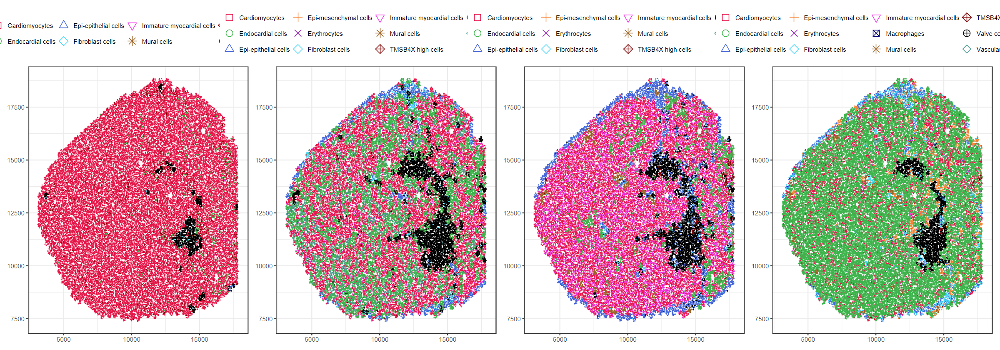

In [3]:
CellLoc <- read.csv(paste0('../Results - Chicken/4_modelling/chicken_CellLoc.csv'))

#CellLoc$matching <- (CellLoc$TF0_ct != CellLoc$TF1_ct) & (CellLoc$TF1_ct != CellLoc$TF2_ct) & (CellLoc$TF2_ct != CellLoc$TF0_ct)
#CellLoc <- CellLoc[which(CellLoc$matching == TRUE), ]

t0 <- strsplit(sort(unique(CellLoc$TF0_ct), decreasing = FALSE), split = "[.]")
t1 <- strsplit(sort(unique(CellLoc$TF1_ct), decreasing = FALSE), split = "[.]")
t2 <- strsplit(sort(unique(CellLoc$TF2_ct), decreasing = FALSE), split = "[.]")
t3 <- strsplit(sort(unique(CellLoc$TF3_ct), decreasing = FALSE), split = "[.]")
idx <- which.max(lengths(list(t0, t1, t2, t3)))
colors <- c('#e6194B', '#3cb44b', '#4363d8', '#f58231', '#911eb4', '#42d4f4', '#f032e6', '#000075', '#9A6324', '#800000', '#000000', '#469990')
shapes <- c('square open', 'circle open', 'triangle open', 'plus', 'cross', 'diamond open', 'triangle down open', 'square cross', 'asterisk', 'diamond plus', 'circle plus', 'diamond filled')
pointColors <- setNames(colors, list(t0, t1, t2, t3)[[idx]])
pointShapes <- setNames(shapes, list(t0, t1, t2, t3)[[idx]])

p1 <- ggplot() + geom_point(CellLoc, mapping=aes(x, y, shape=TF0_ct, color=TF0_ct), size=.001) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
p2 <- ggplot() + geom_point(CellLoc, mapping=aes(x, y, shape=TF1_ct, color=TF1_ct), size=.001) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
p3 <- ggplot() + geom_point(CellLoc, mapping=aes(x, y, shape=TF2_ct, color=TF2_ct), size=.001) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
p4 <- ggplot() + geom_point(CellLoc, mapping=aes(x, y, shape=TF3_ct, color=TF3_ct), size=.001) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)

options(repr.plot.height = 7, repr.plot.width = 20)
p1 + p2 + p3 + p4 + plot_layout(ncol = 4)

In [4]:
ctTF0 <- c(sort(unique(CellLoc$TF0_ct), decreasing = FALSE))
ctTF1 <- c(sort(unique(CellLoc$TF1_ct), decreasing = FALSE))
ctTF2 <- c(sort(unique(CellLoc$TF2_ct), decreasing = FALSE))
ctTF3 <- c(sort(unique(CellLoc$TF3_ct), decreasing = FALSE))

length(ctTF0) <- length(ctTF1) <- length(ctTF2) <- length(ctTF3) <- max(length(ctTF0), length(ctTF1), length(ctTF2), length(ctTF3))                      
ctList <- as.data.frame(cbind(ctTF0, ctTF1, ctTF2, ctTF3))
colnames(ctList) <- c('Celltypes of TF0', 'Celltypes of TF1', 'Celltypes of TF2', 'Celltypes of TF3')
ctList[is.na(ctList)] <- ""
ctList

Celltypes of TF0,Celltypes of TF1,Celltypes of TF2,Celltypes of TF3
<chr>,<chr>,<chr>,<chr>
Cardiomyocytes,Cardiomyocytes,Cardiomyocytes,Cardiomyocytes
Endocardial cells,Endocardial cells,Endocardial cells,Endocardial cells
Epi-epithelial cells,Epi-epithelial cells,Epi-epithelial cells,Epi-epithelial cells
Fibroblast cells,Epi-mesenchymal cells,Epi-mesenchymal cells,Epi-mesenchymal cells
Immature myocardial cells,Erythrocytes,Erythrocytes,Erythrocytes
Mural cells,Fibroblast cells,Fibroblast cells,Fibroblast cells
TMSB4X high cells,Immature myocardial cells,Immature myocardial cells,Immature myocardial cells
Valve cells,Mural cells,Mural cells,Macrophages
,TMSB4X high cells,TMSB4X high cells,Mural cells


###### *Spatiotemporal Cell-Type Redistribution*

In [ ]:
DF0 <- filter(CellLoc, TF0_ct %in% c('Endocardial cells'))
DF1 <- filter(CellLoc, TF1_ct %in% c('Endocardial cells'))
DF2 <- filter(CellLoc, TF2_ct %in% c('Endocardial cells'))
DF3 <- filter(CellLoc, TF3_ct %in% c('Endocardial cells'))
nrow(DF0)
nrow(DF1)
nrow(DF2)
nrow(DF3)

In [ ]:
DF0 <- filter(CellLoc, TF0_ct %in% c('Endocardial cells'))
DF1 <- filter(CellLoc, TF1_ct %in% c('Endocardial cells'))
DF2 <- filter(CellLoc, TF2_ct %in% c('Endocardial cells'))
DF3 <- filter(CellLoc, TF3_ct %in% c('Endocardial cells'))
if (nrow(DF0) != 0 & nrow(DF1) != 0 & nrow(DF2) != 0 & nrow(DF3) != 0){
    p1 <- ggplot(DF0, aes(x, y, shape=TF0_ct, color=TF0_ct)) + geom_point(size=1) + theme_bw() + labs(caption = paste0("Number of cells: ", nrow(DF0))) + theme(plot.caption = element_text(size = 12), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p2 <- ggplot(DF1, aes(x, y, shape=TF1_ct, color=TF1_ct)) + geom_point(size=1) + theme_bw() + labs(caption = paste0("Number of cells: ", nrow(DF1))) + theme(plot.caption = element_text(size = 12), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p3 <- ggplot(DF2, aes(x, y, shape=TF2_ct, color=TF2_ct)) + geom_point(size=1) + theme_bw() + labs(caption = paste0("Number of cells: ", nrow(DF2))) + theme(plot.caption = element_text(size = 12), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p4 <- ggplot(DF3, aes(x, y, shape=TF3_ct, color=TF3_ct)) + geom_point(size=1) + theme_bw() + labs(caption = paste0("Number of cells: ", nrow(DF3))) + theme(plot.caption = element_text(size = 12), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)

    tmp0 = select(DF0, c(x, y, centerSPOT, centerx, centery, TF0, TF0_ct))
    tmp1 = select(DF1, c(x, y, centerSPOT, centerx, centery, TF1, TF1_ct))
    tmp2 = select(DF2, c(x, y, centerSPOT, centerx, centery, TF2, TF2_ct))
    tmp3 = select(DF3, c(x, y, centerSPOT, centerx, centery, TF3, TF3_ct))
    colnames(tmp3)=colnames(tmp2)=colnames(tmp1)=colnames(tmp0)
    CellMig = rbind(tmp0, tmp1, tmp2, tmp2)
    row.names(CellMig) <- seq.int(nrow(CellMig))
    colnames(CellMig) <- c('x', 'y', 'centerSPOT', 'centerx', 'centery', 'TF', 'TF_ct')
    ps <- ggplot() + geom_point(CellMig, mapping = aes(x, y, shape=TF_ct, color=TF_ct), size=1) + theme_bw() + labs(caption = paste0('All time frames of ', DF0$TF0_ct[[1]])) + theme(plot.caption = element_text(size = 12), legend.position="none", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
}
    options(repr.plot.height = 7, repr.plot.width = 20)
    pdf(file = paste0("../Results - Chicken/4_modelling/", smpl_info$case, "_Redist.pdf"), height = 6, width = 20, useDingbats=FALSE)
    p1 + p2 + p3 + p4 + ps + plot_layout(ncol = 5)
    dev.off()

In [ ]:
animp <- ps + transition_time(CellMig$TF) + ease_aes('linear') + labs(title = "Time frame: {frame_time}") + shadow_wake(wake_length = 1) 
animate(animp, nframes = max(CellMig$TF) - min(CellMig$TF) + 1, fps = 1, duration = 3, 
        renderer = gifski_renderer(paste0('./Results - Chicken/4_modelling/', smpl_info$patient, '.gif')))

###### *Inferred Cell-State Dynamics*

In [5]:
DF <- filter(CellLoc, TF0_ct %in% c('TMSB4X high cells') & TF1_ct %in% c('Immature myocardial cells') & TF2_ct %in% c('Cardiomyocytes') & TF3_ct %in% c('Endocardial cells'))
if (nrow(DF) != 0){
    p1 <- ggplot(DF, aes(x, y, shape=TF0_ct, color=TF0_ct)) + geom_point(size=1) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p2 <- ggplot(DF, aes(x, y, shape=TF1_ct, color=TF1_ct)) + geom_point(size=1) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p3 <- ggplot(DF, aes(x, y, shape=TF2_ct, color=TF2_ct)) + geom_point(size=1) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p4 <- ggplot(DF, aes(x, y, shape=TF3_ct, color=TF3_ct)) + geom_point(size=1) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)

    tmp0 = select(DF, c(x, y, centerSPOT, centerx, centery, TF0, TF0_ct))
    tmp1 = select(DF, c(x, y, centerSPOT, centerx, centery, TF1, TF1_ct))
    tmp2 = select(DF, c(x, y, centerSPOT, centerx, centery, TF2, TF2_ct))
    tmp3 = select(DF, c(x, y, centerSPOT, centerx, centery, TF3, TF3_ct))
    colnames(tmp3)=colnames(tmp2)=colnames(tmp1)=colnames(tmp0)
    CellMig = rbind(tmp0, tmp1, tmp2, tmp3)
    row.names(CellMig) <- seq.int(nrow(CellMig))
    colnames(CellMig) <- c('x', 'y', 'centerSPOT', 'centerx', 'centery', 'TF', 'TF_ct')
    pd <- ggplot() + geom_point(CellMig, mapping = aes(x, y, shape=TF_ct, color=TF_ct), size=1) + theme_bw() + labs(caption = paste0("Number of cells in all time frames: ", nrow(DF))) + theme(plot.caption = element_text(size = 14), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
}
    options(repr.plot.height = 6, repr.plot.width = 20)
    pdf(file = paste0("../Results - Chicken/4_modelling/", smpl_info$case, "_CellState.pdf"), height = 6, width = 20, useDingbats=FALSE)
    p1 + p2 + p3 + p4 + pd + plot_layout(ncol = 5)
    dev.off()

agg_record_428627504 
                   2

In [14]:
library(plotly)
library(webshot2)

all_types <- sort(unique(c(CellLoc$TF0_ct, CellLoc$TF1_ct, CellLoc$TF2_ct, CellLoc$TF3_ct)))

pointColors <- setNames(colors[1:length(all_types)], all_types)
pointShapes <- setNames(shapes[1:length(all_types)], all_types)

DF <- filter(CellLoc, TF0_ct %in% c('TMSB4X high cells') & TF1_ct %in% c('Immature myocardial cells') &
             TF2_ct %in% c('Cardiomyocytes') & TF3_ct %in% c('Endocardial cells'))

if (nrow(DF) != 0){
    tmp0 <- DF %>% select(x, y, TF0, TF0_ct) %>% mutate(z = 0, TF_ct = TF0_ct)
    tmp1 <- DF %>% select(x, y, TF1, TF1_ct) %>% mutate(z = 1, TF_ct = TF1_ct)
    tmp2 <- DF %>% select(x, y, TF2, TF2_ct) %>% mutate(z = 2, TF_ct = TF2_ct)
    tmp3 <- DF %>% select(x, y, TF3, TF3_ct) %>% mutate(z = 3, TF_ct = TF3_ct)
    CellMig <- bind_rows(tmp0, tmp1, tmp2, tmp3)
    
    CellMig$TF_ct <- factor(CellMig$TF_ct, levels = names(pointColors))
    
    fig <- plot_ly(data   = CellMig, x = ~x, y = ~y, z = ~z, 
                   color  = ~TF_ct, colors = pointColors,
                   symbol = ~TF_ct, symbols = pointShapes,
                   type   = "scatter3d", mode   = "markers", marker = list(size = 4)
                   )
    fig <- fig %>% layout(scene = list(
        xaxis = list(title = "", showticklabels = FALSE, showgrid = TRUE, zeroline = FALSE),
        yaxis = list(title = "", showticklabels = FALSE, showgrid = TRUE, zeroline = FALSE),
        zaxis = list(title = "", tickmode = "array", tickvals = c(0, 1, 2, 3), ticktext = c("Time t = 0", "Time t = 1", "Time t = 2", "Time t = 3"))),
                          legend = list(title = list(text = "")),
                          annotations = list(
                              list(text = paste0("Number of cells in all time frames: ", nrow(DF)),
                                   x = 0.5, y = 0, xref = "paper", yref = "paper", showarrow = FALSE, font = list(size = 14)))
                         )
    fig
}

webshot2::webshot(url = "CellDiff_3D.html", file = "CellMigration3D.png", vwidth = 3000, vheight = 3000, zoom = 4, delay = 2)

HTML widgets cannot be represented in plain text (need html)

file:///D:/PhD dissertation/In progress/Learning-based Modeling of Tumor Cell Migration/Results - Chicken/CellDiff_3D.html screenshot completed

